# Speech Waveform Augmentation
**Author:** Xin Wang
**Date:** 2026-02-09
**Status:** Published


Fpr speech deepfake detection, speech waveform augmentation has emerged as a critical technique to improve model generalization against unseen spoofing attacks and diverse acoustic environments. 

Typical approaches include
* Additive perturbations: addition of background noise 
* Convolutive perturbations: convolving room impulse responses (RIR)
* Speed, pitch, and other types of manupulations \* 
* Applying codecs \*
* Filtering that simulate the transmission effect, using [RawBoost](https://github.com/TakHemlata/RawBoost-antispoofing) \*

This tutorial will cover some of the techniques implemented in [WeDefense](https://github.com/zlin0/wedefense/tree/main?tab=readme-ov-file#%EF%B8%8F-what-wedefense-offers), which are marked with \* in the above list.

For addtive noise and RIR, they have will covered by many other tutorials, please check related pages (e.g., by [Speechbrain](https://speechbrain.readthedocs.io/en/latest/tutorials/preprocessing/environmental-corruption.html) and [TorchAudio](https://docs.pytorch.org/audio/stable/tutorials/audio_data_augmentation_tutorial.html)). 

Notes:
1. We will use the code snippet from WeDefense
2. Recipe using each of the augmentation is covered in the second part of this notebook

## Prepare the environment

Let's download a sample waveform file

In [ ]:
!wget -q https://www.dropbox.com/s/u8qyvuyie2op286/spk1_snt1.wav

Load packages

In [ ]:
# Will need torch and torchaudio

import torch
import torchaudio
import torchaudio.transforms as T
import numpy as np
import random

In [ ]:
# for figure plotting & audio rendering
import matplotlib.pyplot as plt
from IPython.display import Audio
from IPython.display import display

In [ ]:
# from Torchaudio tutorial
# https://docs.pytorch.org/audio/stable/tutorials/audio_feature_augmentation_tutorial.html
def load_wav(wav_path):
    return torchaudio.load(wav_path)

def get_spectrogram(
    wav,
    n_fft=400,
    win_len=None,
    hop_len=None,
    power=2.0,
):
    spectrogram = T.Spectrogram(
        n_fft=n_fft,
        win_length=win_len,
        hop_length=hop_len,
        center=True,
        pad_mode="reflect",
        power=power,
    )
    return 20 * torch.log10(spectrogram(wav))


def plot_spec(spec):
    fig = plt.figure()
    axis = fig.add_subplot(111)
    axis.imshow(spec, aspect='auto', origin='lower')
    return fig, axis

## Speed perturbation

The WeDefense relies on torchaudio [sox_effect](https://docs.pytorch.org/audio/main/generated/torchaudio.sox_effects.apply_effects_tensor.html) API to conduct speed perturbation


In [ ]:
# input original waveform
wav_path = './spk1_snt1.wav'

Waveform length:  torch.Size([45920])


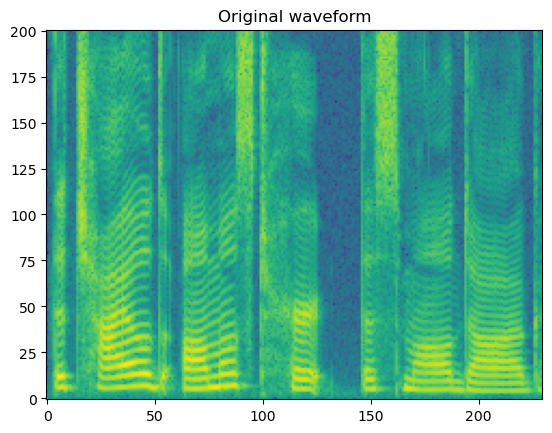

In [ ]:
wav, sr = load_wav(wav_path)
spec = get_spectrogram(wav)
fig, axis = plot_spec(spec[0])
axis.set_title('Original waveform')
display(Audio(wav[0], rate=sr))

print("Waveform length: ", wav[0].size())

We copy the the speed perturbation function here, with a minimum change to add the speed_idx as an optional input

In [ ]:
def speed_perturb(data, num_labs, speed_idx=None):
    """ Apply speed perturb to the data.
        Inplace operation.

        Args:
            data: Iterable[{key, wav, label, sample_rate}]

        Returns:
            Iterable[{key, wav, label, sample_rate}]
    """
    speeds = [1.0, 0.9, 1.1]
    for sample in data:
        assert 'sample_rate' in sample
        assert 'wav' in sample
        sample_rate = sample['sample_rate']
        waveform = sample['wav']
        if speed_idx is None:
            speed_idx = random.randint(0, 2)
        if speed_idx > 0:
            wav, _ = torchaudio.sox_effects.apply_effects_tensor(
                waveform, sample_rate,
                [['speed', str(speeds[speed_idx])], ['rate',
                                                     str(sample_rate)]])
            sample['wav'] = wav
            sample['label'] = sample['label'] + num_labs * speed_idx

        yield sample

In [ ]:
# for example, let's slow down the waveform using speeds factor 0.9 (speeds[1])
input_sample = [{'wav': wav, 'label': 0.0, 'sample_rate': sr}]
output_sample = next(speed_perturb(input_sample, num_labs=2, speed_idx=1))

Waveform length:  torch.Size([51022])


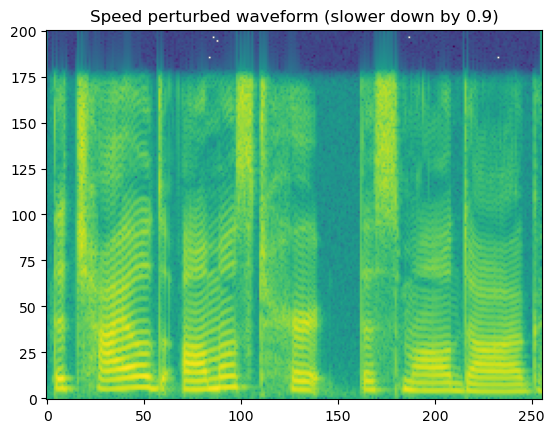

In [ ]:
wav_speed_perturbed = output_sample['wav']
spec = get_spectrogram(wav_speed_perturbed)
fig, axis = plot_spec(spec[0])
axis.set_title('Speed perturbed waveform (slower down by 0.9)')
display(Audio(wav[0], rate=sr))

print("Waveform length: ", wav_speed_perturbed[0].size())

In [ ]:
# for example, let's slow down the waveform using speeds factor 1.1 (speeds[2])
input_sample = [{'wav': wav, 'label': 0.0, 'sample_rate': sr}]
output_sample = next(speed_perturb(input_sample, num_labs=2, speed_idx=2))

Waveform length:  torch.Size([41745])


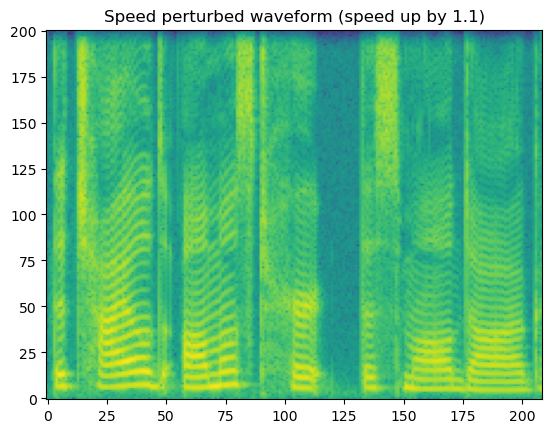

In [ ]:
wav_speed_perturbed = output_sample['wav']
spec = get_spectrogram(wav_speed_perturbed)
fig, axis = plot_spec(spec[0])
axis.set_title('Speed perturbed waveform (speed up by 1.1)')
display(Audio(wav[0], rate=sr))

print("Waveform length: ", wav_speed_perturbed[0].size())

## Applying codecs

```bash
              ---------
input wave -> | codec | -> coded wave
              ---------
```

The idea is that, using the coded wave as training data, the model can learn to deal with the codecs applied to various channels and transmission conditions.


We demonstrate the usage following the [WeDefense implementation](https://github.com/zlin0/wedefense/blob/main/wedefense/dataset/augmentation/codec_util.py)



In [ ]:

from torchaudio.io import CodecConfig, AudioEffector

SUPPORTED_CODEC_FOR_AUGMENTATION = [
    'mp3', 'ogg-vorbis', 'ogg-opus', 'g722', 'mu-law', 'pcm16'
]

SUPPORTED_CODEC_CONFIG = {
    'mp3': [8000, 16000, 32000, 64000, 92000, 128000],
    'ogg-vorbis': [8000, 16000, 32000, 64000, 92000, 128000],
    'ogg-opus': [8000, 16000, 32000, 64000, 92000, 128000],
    'g722': [48000, 56000, 64000],
    'mu-law': [-1],
    'pcm16': [-1]
}

Notice that the range of bit rate is hard-wired in the code.

In [ ]:
def codec_apply(wav_in, sr, format, bitrate=-1, q_factor=None):
    """ Apply codec to input waveform

        Args:
            wav_in (tensor): waveform in shape [channel, time]
            sr (int): sampling rate
            format (str): name of the format
            bitrate (int): expected bitrate
            q_factor (float): q factor of codec
        Return:
            waveform_coded (tensor): waveform in the same shape as input
    """

    assert wav_in.ndim == 2, "Codec_apply: input waveform be in shape [channel, time]"
    assert wav_in.shape[0] == 1 or wav_in.shape[
        1] == 1, "Codec_apply: not single channel wav"

    # change to [time, channel] format
    wav_ = wav_in.T if wav_in.shape[0] == 1 else wav_in

    if format != 'mu-law' and format != 'pcm16':
        assert (q_factor is None and bitrate >= 0) \
            or (q_factor is not None and bitrate == -1), \
            "Codec_apply: please set either bitrate or q_factor"

    codec_config = CodecConfig(bit_rate=bitrate, qscale=q_factor)

    if format == 'mp3':
        codec = AudioEffector(format=format, codec_config=codec_config)
    elif format == "ogg-vorbis":
        codec = AudioEffector(format="ogg",
                              encoder="vorbis",
                              codec_config=codec_config)
    elif format == "ogg-opus":
        codec = AudioEffector(format="ogg",
                              encoder="opus",
                              codec_config=codec_config)
    elif format == "g722":
        codec = AudioEffector(format="wav",
                              encoder="g722",
                              codec_config=codec_config)
    elif format == "speex":
        codec = AudioEffector(format="ogg",
                              encoder="libspeex",
                              codec_config=codec_config)
    elif format == "gsm":
        codec = AudioEffector(format="gsm",
                              encoder="libgsm",
                              codec_config=codec_config)
    elif format == "g726":
        codec = AudioEffector(format="g726",
                              encoder="g726",
                              codec_config=codec_config)
    elif format == "mu-law":
        codec = AudioEffector(format="wav", encoder="pcm_mulaw")
    elif format == "pcm16":
        codec = AudioEffector(format="wav", encoder="pcm_s16le")
    else:
        raise ValueError(f"Format '{format}' not supported")

    waveform_coded = codec.apply(wav_, sr)

    if wav_in.shape[0] == 1:
        return waveform_coded.T
    else:
        return waveform_coded

In [ ]:
# input original waveform
wav_path = './spk1_snt1.wav'

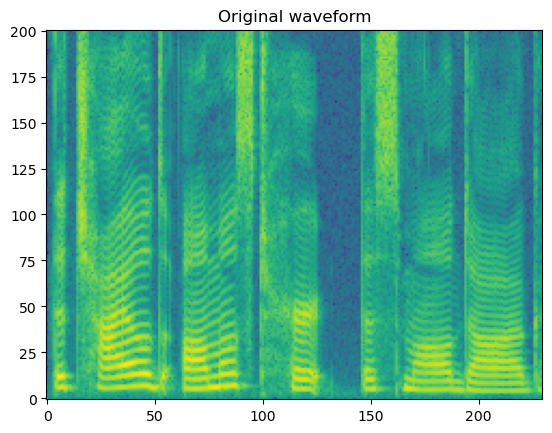

In [ ]:
wav, sr = load_wav(wav_path)
spec = get_spectrogram(wav)
fig, axis = plot_spec(spec[0])
axis.set_title('Original waveform')
display(Audio(wav[0], rate=sr))


Let's try to iterate and try different codecs in different configurations.

Let's treat the batch index of `wav` as the channel index :) 

'Codec waveform by mp3 (bit rate 8000)'

'Codec waveform by mp3 (bit rate 16000)'

'Codec waveform by mp3 (bit rate 32000)'

'Codec waveform by mp3 (bit rate 64000)'

'Codec waveform by mp3 (bit rate 92000)'

'Codec waveform by mp3 (bit rate 128000)'

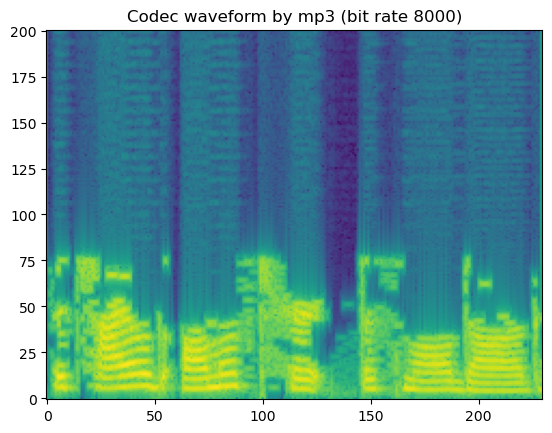

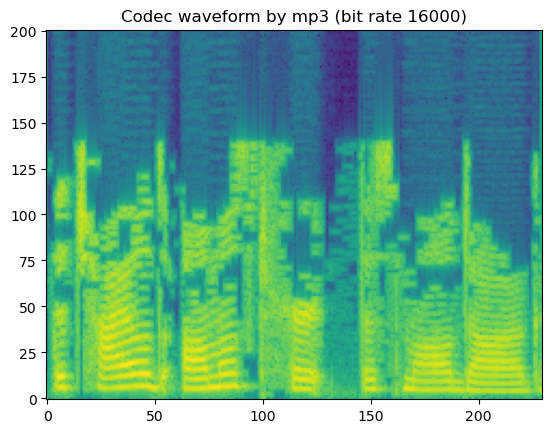

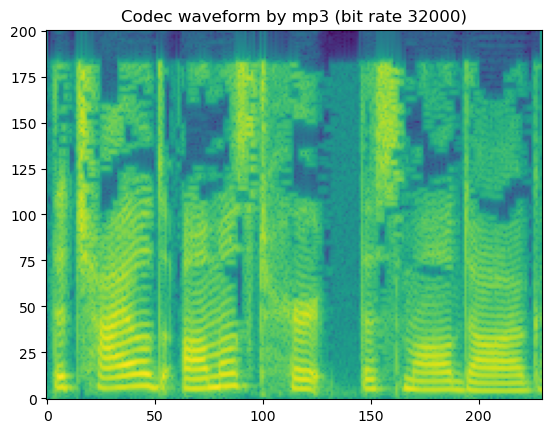

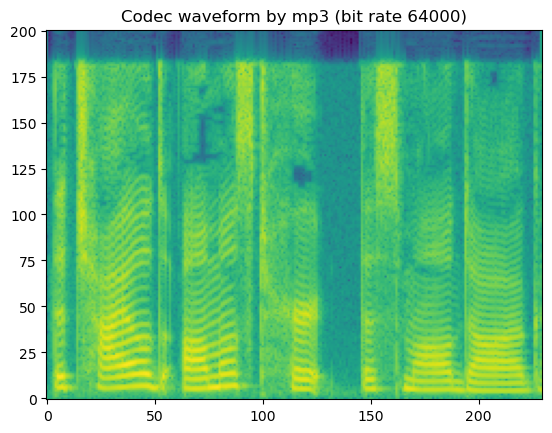

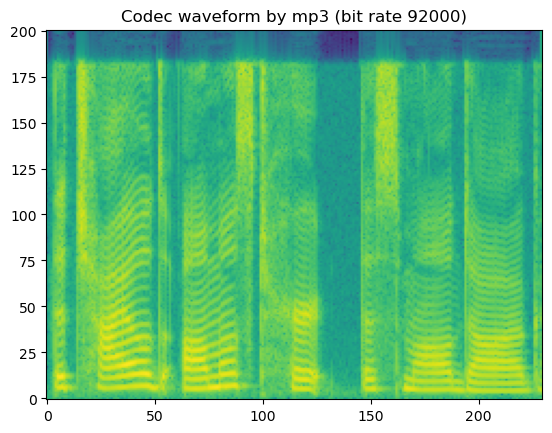

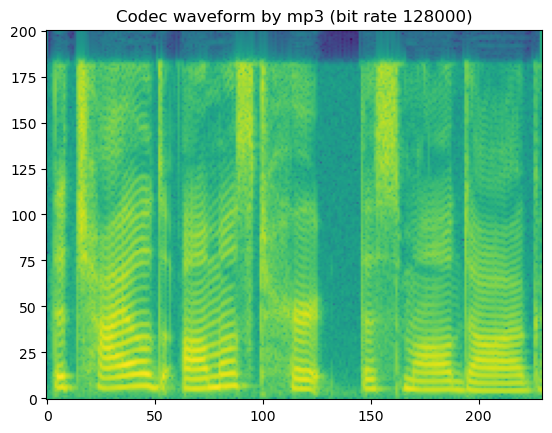

In [ ]:
# mp3

codec_type = SUPPORTED_CODEC_FOR_AUGMENTATION[0]
for bit_rate in SUPPORTED_CODEC_CONFIG[codec_type]:
    coded_wav = codec_apply(wav, sr, codec_type, bit_rate)
    spec = get_spectrogram(coded_wav)
    fig, axis = plot_spec(spec[0])
    axis.set_title('Codec waveform by {:s} (bit rate {:d})'.format(codec_type, bit_rate))
    display('Codec waveform by {:s} (bit rate {:d})'.format(codec_type, bit_rate))
    display(Audio(coded_wav[0], rate=sr))


'Codec waveform by ogg-opus (bit rate 8000)'

'Codec waveform by ogg-opus (bit rate 16000)'

'Codec waveform by ogg-opus (bit rate 32000)'

'Codec waveform by ogg-opus (bit rate 64000)'

'Codec waveform by ogg-opus (bit rate 92000)'

'Codec waveform by ogg-opus (bit rate 128000)'

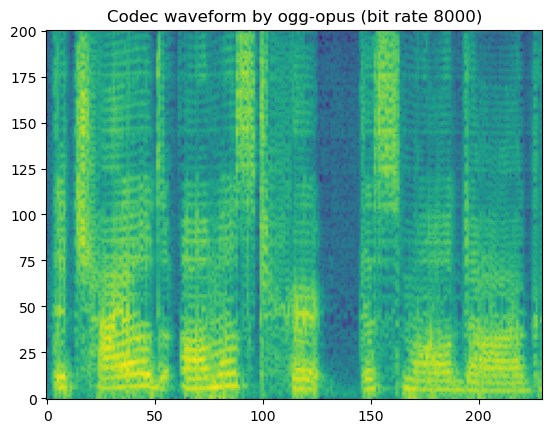

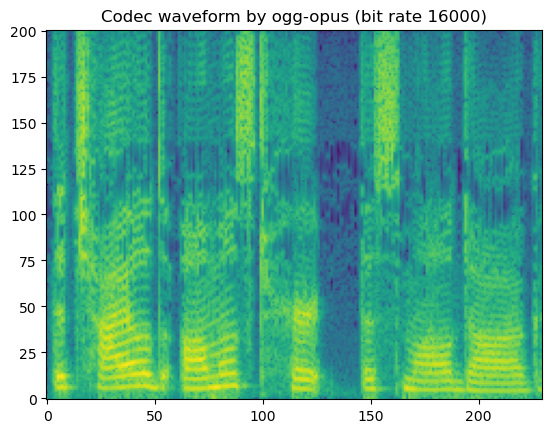

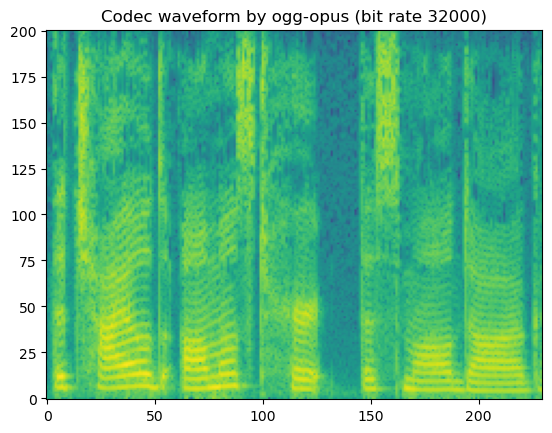

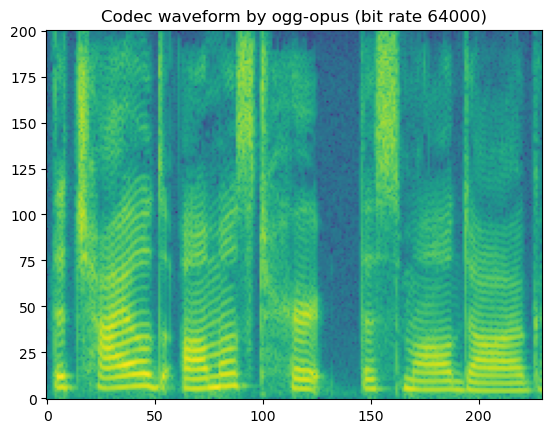

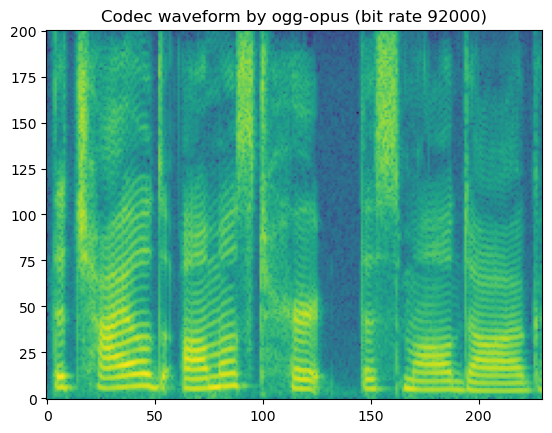

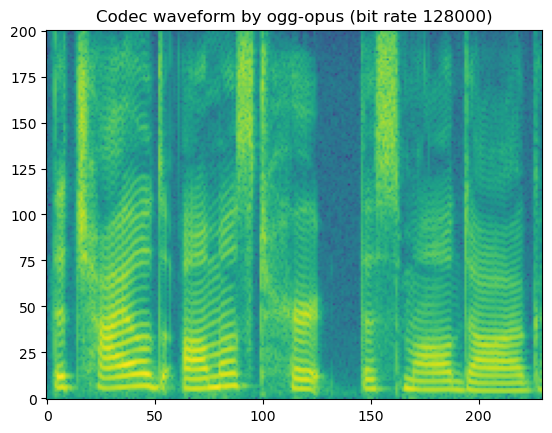

In [ ]:
# ogg-opus

codec_type = SUPPORTED_CODEC_FOR_AUGMENTATION[2]
for bit_rate in SUPPORTED_CODEC_CONFIG[codec_type]:
    coded_wav = codec_apply(wav, sr, codec_type, bit_rate)
    spec = get_spectrogram(coded_wav)
    fig, axis = plot_spec(spec[0])
    axis.set_title('Codec waveform by {:s} (bit rate {:d})'.format(codec_type, bit_rate))
    display('Codec waveform by {:s} (bit rate {:d})'.format(codec_type, bit_rate))
    display(Audio(coded_wav[0], rate=sr))
    

'Codec waveform by g722 (bit rate 48000)'

'Codec waveform by g722 (bit rate 56000)'

'Codec waveform by g722 (bit rate 64000)'

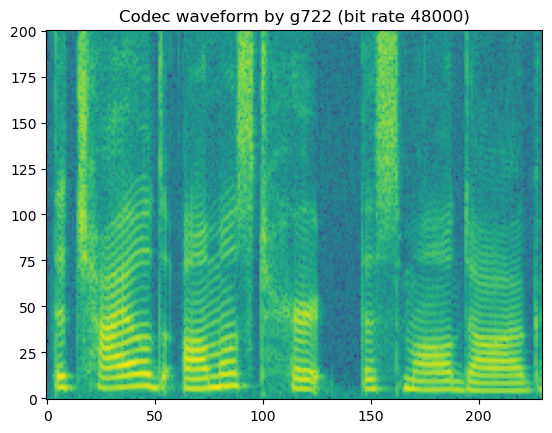

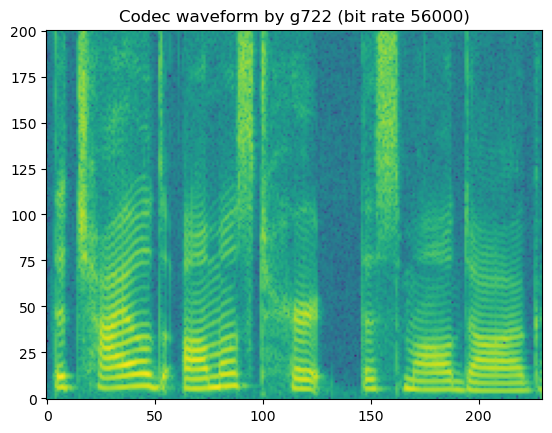

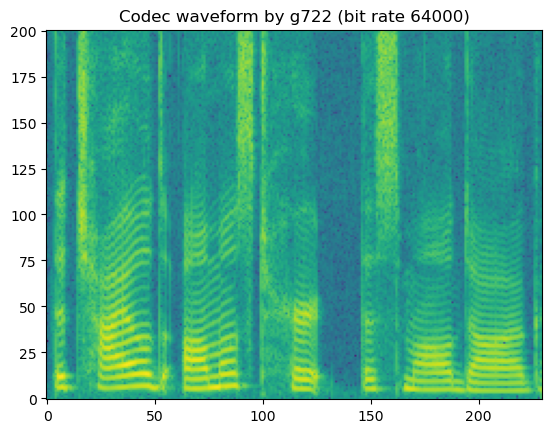

In [ ]:
# g722
# Notice that g722 barely introduce perceptable artifacts since it is 
# designed for high-quality speech waveform coding using AD-PCM
# https://en.wikipedia.org/wiki/G.722

codec_type = SUPPORTED_CODEC_FOR_AUGMENTATION[-3]
for bit_rate in SUPPORTED_CODEC_CONFIG[codec_type]:
    coded_wav = codec_apply(wav, sr, codec_type, bit_rate)
    spec = get_spectrogram(coded_wav)
    fig, axis = plot_spec(spec[0])
    axis.set_title('Codec waveform by {:s} (bit rate {:d})'.format(codec_type, bit_rate))
    display('Codec waveform by {:s} (bit rate {:d})'.format(codec_type, bit_rate))
    display(Audio(coded_wav[0], rate=sr))
    

In short, lossy codecs introduce perceptable degradation, especially the mp3, ogg-vorbis, and ogg-opus.

The lower the bit rate is, the larger the degradation becomes. 

See more on different types of codes supported by [Torchaudio](https://docs.pytorch.org/audio/2.5.0/tutorials/effector_tutorial.html).

## RawBoost

This is the augmentation method designed specifically for speech anti-deepfake. 

<a>
  <img src="https://figures.semanticscholar.org/d24eec1810001687349b25e8ca7cad924f16164d/3-Figure1-1.png" alt="Description of image" width="800" />
</a>

```bibtex
@inproceedings{tak2021rawboost,
  title={RawBoost: A Raw Data Boosting and Augmentation Method applied to Automatic Speaker Verification Anti-Spoofing},
  author={Tak, Hemlata and Kamble, Madhu and Patino, Jose and Todisco, Massimiliano and Evans, Nicholas},
  booktitle={IEEE International Conference on Acoustics, Speech and Signal Processing (ICASSP)},
  year={2022}
}
```

The implementation is based on the official [RawBoost](https://github.com/TakHemlata/RawBoost-antispoofing/tree/main)

In [ ]:
# -*- coding: utf-8 -*-
# copy from https://github.com/TakHemlata/RawBoost-antispoofing/blob/main/RawBoost.py  # noqa
# For paper: RawBoost: A Raw Data Boosting and Augmentation Method applied to
#                      Automatic Speaker Verification Anti-Spoofing
# https://arxiv.org/pdf/2111.04433
# Author: Hemlata Tak, Madhu Kamble, Jose Patino, Massimiliano Todisco and Nicholas Evans  # noqa

import numpy as np
from scipy import signal
import copy


def randRange(x1, x2, integer):
    y = np.random.uniform(low=x1, high=x2, size=(1, ))
    if integer:
        y = int(y)
    return y


def normWav(x, always):
    if always:
        x = x / np.amax(abs(x))
    elif np.amax(abs(x)) > 1:
        x = x / np.amax(abs(x))
    return x


def genNotchCoeffs(nBands, minF, maxF, minBW, maxBW, minCoeff, maxCoeff, minG,
                   maxG, fs):
    b = 1
    for i in range(0, nBands):
        fc = randRange(minF, maxF, 0)
        bw = randRange(minBW, maxBW, 0)
        c = randRange(minCoeff, maxCoeff, 1)

        if c / 2 == int(c / 2):
            c = c + 1
        f1 = fc - bw / 2
        f2 = fc + bw / 2
        if f1 <= 0:
            f1 = 1 / 1000
        if f2 >= fs / 2:
            f2 = fs / 2 - 1 / 1000
        b = np.convolve(
            signal.firwin(c, [float(f1), float(f2)], window='hamming', fs=fs),
            b)

    G = randRange(minG, maxG, 0)
    _, h = signal.freqz(b, 1, fs=fs)
    b = pow(10, G / 20) * b / np.amax(abs(h))
    return b


def filterFIR(x, b):
    N = b.shape[0] + 1
    xpad = np.pad(x, (0, N), 'constant')
    y = signal.lfilter(b, 1, xpad)
    y = y[int(N / 2):int(y.shape[0] - N / 2)]
    return y


# Linear and non-linear convolutive noise
def LnL_convolutive_noise(x, N_f, nBands, minF, maxF, minBW, maxBW, minCoeff,
                          maxCoeff, minG, maxG, minBiasLinNonLin,
                          maxBiasLinNonLin, fs):
    y = [0] * x.shape[0]
    for i in range(0, N_f):
        if i == 1:
            minG = minG - minBiasLinNonLin
            maxG = maxG - maxBiasLinNonLin
        b = genNotchCoeffs(nBands, minF, maxF, minBW, maxBW, minCoeff,
                           maxCoeff, minG, maxG, fs)
        y = y + filterFIR(np.power(x, (i + 1)), b)
    y = y - np.mean(y)
    y = normWav(y, 0)
    return y


# Impulsive signal dependent noise
def ISD_additive_noise(x, P, g_sd):
    beta = randRange(0, P, 0)

    y = copy.deepcopy(x)
    x_len = x.shape[0]
    n = int(x_len * (beta / 100))
    p = np.random.permutation(x_len)[:n]
    f_r = np.multiply(((2 * np.random.rand(p.shape[0])) - 1),
                      ((2 * np.random.rand(p.shape[0])) - 1))
    r = g_sd * x[p] * f_r
    y[p] = x[p] + r
    y = normWav(y, 0)
    return y


# Stationary signal independent noise
def SSI_additive_noise(x, SNRmin, SNRmax, nBands, minF, maxF, minBW, maxBW,
                       minCoeff, maxCoeff, minG, maxG, fs):
    noise = np.random.normal(0, 1, x.shape[0])
    b = genNotchCoeffs(nBands, minF, maxF, minBW, maxBW, minCoeff, maxCoeff,
                       minG, maxG, fs)
    noise = filterFIR(noise, b)
    noise = normWav(noise, 1)
    SNR = randRange(SNRmin, SNRmax, 0)
    noise = noise / np.linalg.norm(noise, 2) * np.linalg.norm(
        x, 2) / 10.0**(0.05 * SNR)
    x = x + noise
    return x

In [ ]:
import argparse
import scipy.io.wavfile as sciwav

def process_Rawboost_feature(feature, sr, args, algo):

    # Data process by Convolutive noise (1st algo)
    if algo == 1:

        feature = LnL_convolutive_noise(feature, args.N_f, args.nBands,
                                        args.minF, args.maxF, args.minBW,
                                        args.maxBW, args.minCoeff,
                                        args.maxCoeff, args.minG, args.maxG,
                                        args.minBiasLinNonLin,
                                        args.maxBiasLinNonLin, sr)

    # Data process by Impulsive noise (2nd algo)
    elif algo == 2:

        feature = ISD_additive_noise(feature, args.P, args.g_sd)

    # Data process by coloured additive noise (3rd algo)
    elif algo == 3:

        feature = SSI_additive_noise(feature, args.SNRmin, args.SNRmax,
                                     args.nBands, args.minF, args.maxF,
                                     args.minBW, args.maxBW, args.minCoeff,
                                     args.maxCoeff, args.minG, args.maxG, sr)

    # Data process by all 3 algo. together in series (1+2+3)
    elif algo == 4:

        feature = LnL_convolutive_noise(feature, args.N_f, args.nBands,
                                        args.minF, args.maxF, args.minBW,
                                        args.maxBW, args.minCoeff,
                                        args.maxCoeff, args.minG, args.maxG,
                                        args.minBiasLinNonLin,
                                        args.maxBiasLinNonLin, sr)
        feature = ISD_additive_noise(feature, args.P, args.g_sd)
        feature = SSI_additive_noise(feature, args.SNRmin, args.SNRmax,
                                     args.nBands, args.minF, args.maxF,
                                     args.minBW, args.maxBW, args.minCoeff,
                                     args.maxCoeff, args.minG, args.maxG, sr)

    # Data process by 1st two algo. together in series (1+2)
    elif algo == 5:

        feature = LnL_convolutive_noise(feature, args.N_f, args.nBands,
                                        args.minF, args.maxF, args.minBW,
                                        args.maxBW, args.minCoeff,
                                        args.maxCoeff, args.minG, args.maxG,
                                        args.minBiasLinNonLin,
                                        args.maxBiasLinNonLin, sr)
        feature = ISD_additive_noise(feature, args.P, args.g_sd)

    # Data process by 1st and 3rd algo. together in series (1+3)
    elif algo == 6:

        feature = LnL_convolutive_noise(feature, args.N_f, args.nBands,
                                        args.minF, args.maxF, args.minBW,
                                        args.maxBW, args.minCoeff,
                                        args.maxCoeff, args.minG, args.maxG,
                                        args.minBiasLinNonLin,
                                        args.maxBiasLinNonLin, sr)
        feature = SSI_additive_noise(feature, args.SNRmin, args.SNRmax,
                                     args.nBands, args.minF, args.maxF,
                                     args.minBW, args.maxBW, args.minCoeff,
                                     args.maxCoeff, args.minG, args.maxG, sr)

    # Data process by 2nd and 3rd algo. together in series (2+3)
    elif algo == 7:

        feature = ISD_additive_noise(feature, args.P, args.g_sd)
        feature = SSI_additive_noise(feature, args.SNRmin, args.SNRmax,
                                     args.nBands, args.minF, args.maxF,
                                     args.minBW, args.maxBW, args.minCoeff,
                                     args.maxCoeff, args.minG, args.maxG, sr)

    # Data process by 1st two algo. together in Parallel (1||2)
    elif algo == 8:

        feature1 = LnL_convolutive_noise(feature, args.N_f, args.nBands,
                                         args.minF, args.maxF, args.minBW,
                                         args.maxBW, args.minCoeff,
                                         args.maxCoeff, args.minG, args.maxG,
                                         args.minBiasLinNonLin,
                                         args.maxBiasLinNonLin, sr)
        feature2 = ISD_additive_noise(feature, args.P, args.g_sd)

        feature_para = feature1 + feature2
        feature = normWav(feature_para, 0)  # normalized resultant waveform

    # original data without Rawboost processing
    else:

        feature = feature

    return feature


# --------------Parameters for RawBoost data augmentation algorithms--------- ##


# Raeboost contain too many parameters, and we usually use the default configuration.  # noqa
# So to make life easier, I put parameters here.
# But need to #TODO pay attention for sampling rate related parameters.
def get_args_for_rawboost():
    parser = argparse.ArgumentParser(add_help=False)

    # LnL_convolutive_noise parameters
    parser.add_argument(
        '--nBands',
        type=int,
        default=5,
        help='number of notch filters.The higher the number of bands, '
        'the more aggresive the distortions is.[default=5]')
    parser.add_argument(
        '--minF',
        type=int,
        default=20,
        help='minimum centre frequency [Hz] of notch filter.[default=20]')
    parser.add_argument(
        '--maxF',
        type=int,
        default=8000,
        help='maximum centre frequency [Hz] (<sr/2) of notch filter. '
        '[default=8000]')
    parser.add_argument('--minBW',
                        type=int,
                        default=100,
                        help='minimum width [Hz] of filter.[default=100]')
    parser.add_argument('--maxBW',
                        type=int,
                        default=1000,
                        help='maximum width [Hz] of filter.[default=1000]')
    parser.add_argument(
        '--minCoeff',
        type=int,
        default=10,
        help='minimum filter coefficients. '
        'More the filter coefficients more ideal the filter slope. '
        '[default=10]')
    parser.add_argument(
        '--maxCoeff',
        type=int,
        default=100,
        help='maximum filter coefficients. '
        'More the filter coefficients more ideal the filter slope. '
        '[default=100]')
    parser.add_argument(
        '--minG',
        type=int,
        default=0,
        help='minimum gain factor of linear component.[default=0]')
    parser.add_argument(
        '--maxG',
        type=int,
        default=0,
        help='maximum gain factor of linear component.[default=0]')
    parser.add_argument(
        '--minBiasLinNonLin',
        type=int,
        default=5,
        help='minimum gain difference between linear and non-linear components. '
        '[default=5]')
    parser.add_argument(
        '--maxBiasLinNonLin',
        type=int,
        default=20,
        help='maximum gain difference between linear and non-linear components. '
        '[default=20]')
    parser.add_argument('--N_f',
                        type=int,
                        default=5,
                        help='order of the (non-)linearity component. '
                        'where N_f=1 refers only to linear components. '
                        '[default=5]')

    # ISD_additive_noise parameters
    parser.add_argument(
        '--P',
        type=int,
        default=10,
        help='Maximum number of uniformly distributed samples in [%]. '
        '[defaul=10]')
    parser.add_argument('--g_sd',
                        type=int,
                        default=2,
                        help='gain parameters > 0. [default=2]')

    # SSI_additive_noise parameters
    parser.add_argument(
        '--SNRmin',
        type=int,
        default=10,
        help='Minimum SNR value for coloured additive noise.[defaul=10]')
    parser.add_argument(
        '--SNRmax',
        type=int,
        default=40,
        help='Maximum SNR value for coloured additive noise.[defaul=40]')

    # ================== Rawboost data augmentation ========================== #
    args, _ = parser.parse_known_args()

    return args


We usually use the default RawBoost configuration that applies the two modules sequentially
* linear and non-linear convolutive noise
* impulsive signaldependent additive noise 
This turns out to be the best option in the originl paper (series: (1)+(2) in Table 2)

```python
        feature = LnL_convolutive_noise(feature, args.N_f, args.nBands,
                                        args.minF, args.maxF, args.minBW,
                                        args.maxBW, args.minCoeff,
                                        args.maxCoeff, args.minG, args.maxG,
                                        args.minBiasLinNonLin,
                                        args.maxBiasLinNonLin, sr)
        feature = ISD_additive_noise(feature, args.P, args.g_sd)
```


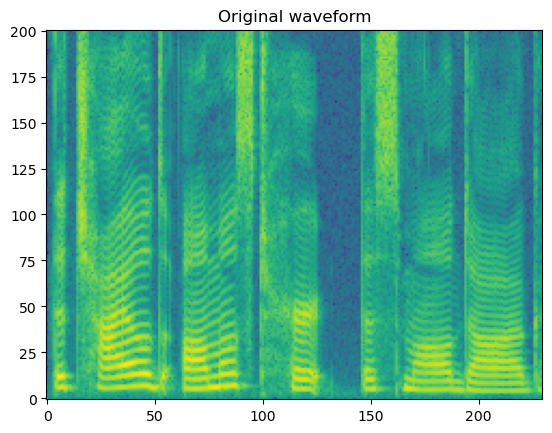

In [ ]:
# input original waveform
wav_path = './spk1_snt1.wav'

wav, sr = load_wav(wav_path)
spec = get_spectrogram(wav)
fig, axis = plot_spec(spec[0])
axis.set_title('Original waveform')
display(Audio(wav[0], rate=sr))


/tmp/6567898.1.all.q/ipykernel_1652426/1025147617.py:16: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  y = int(y)
/tmp/6567898.1.all.q/ipykernel_1652426/1025147617.py:45: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  signal.firwin(c, [float(f1), float(f2)], window='hamming', fs=fs),
/tmp/6567898.1.all.q/ipykernel_1652426/1025147617.py:73: DeprecationWarning: __array_wrap__ must accept context and return_scalar arguments (positionally) in the future. (Deprecated NumPy 2.0)
  y = y + filterFIR(np.power(x, (i + 1)), b)
/tmp/6567898.1.all.q/ipykernel_1652426/1025147617.py:85: DeprecationWarning: Conversion of an array with ndim > 0 to a scala

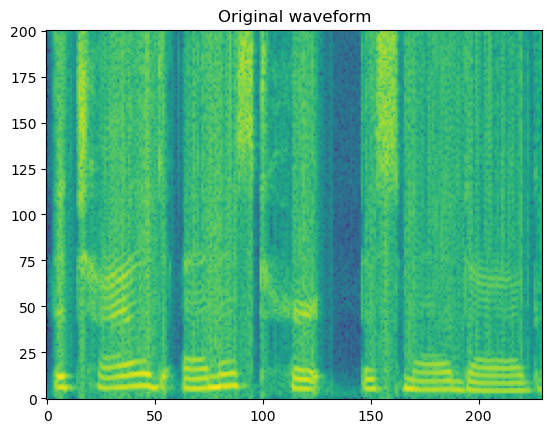

In [ ]:
args = get_args_for_rawboost()
out_audio = process_Rawboost_feature(
            wav[0], sr, args, algo=5)

spec = get_spectrogram(torch.tensor(out_audio).unsqueeze(0))
fig, axis = plot_spec(spec[0].numpy())
axis.set_title('Original waveform')
display(Audio(out_audio, rate=sr))


The degradation may be heavy, but it is expected to similate degradation seen in telephony scenarios. 

Furthermore, RawBoost requires no model training. It can be easily applied to the dataloader in Torch.

## Recipes in WeDefense

To use the data augmentation in WeDefense data loader, you can simply add configurations in the yaml file.

### How to turn on augmentation

For example, in the [recipe of ResNet for Partialspoof](https://github.com/zlin0/wedefense/blob/main/egs/detection/partialspoof/v03_resnet18/conf/resnet_rawboost.yaml), the RawBoost with the default configuration is set to `True`

```yaml
dataset_args:
  ...
  rawboost: True
```

Similarly, `speech_perturb` and `codec_aug` can be turned on by specifying

```yaml
dataset_args:
  ...
  speed_perturb: True
  codec_aug: True
```


### Default behaviors in WeDefense


The current implementation will randomly pick configuration of augmentation for each input utterance
1. For RawBoost, as aforementioend, the RawBoost with the default configuration (series 1+2) and apply it in the dataloader (see [code](https://github.com/zlin0/wedefense/blob/ddd1494390efd2d324a40dec923fa4655636e047/wedefense/dataset/dataset.py#L308))
1. For [speed perturbation](https://github.com/zlin0/wedefense/blob/ddd1494390efd2d324a40dec923fa4655636e047/wedefense/dataset/processor.py#L277), the perturbation factor is randomly choosen to be 1.0 (no change), 0.9 (slower down), or 1.1 (accelerate) 
2. For [codec_aug](https://github.com/zlin0/wedefense/blob/ddd1494390efd2d324a40dec923fa4655636e047/wedefense/dataset/processor.py#L671), the codec type and the bit rate are randomly sampled from the pre-defined list.
```python
SUPPORTED_CODEC_FOR_AUGMENTATION = [
    'mp3', 'ogg-vorbis', 'ogg-opus', 'g722', 'mu-law', 'pcm16'
]

SUPPORTED_CODEC_CONFIG = {
    'mp3': [8000, 16000, 32000, 64000, 92000, 128000],
    'ogg-vorbis': [8000, 16000, 32000, 64000, 92000, 128000],
    'ogg-opus': [8000, 16000, 32000, 64000, 92000, 128000],
    'g722': [48000, 56000, 64000],
    'mu-law': [-1],
    'pcm16': [-1]
}
```



Note that, in the current implementation, the order of data augmentation is fixed:

```bash
              -----------------    ------------    -------------    ---------
input wave -> | speed perturb | -> | rawboost | -> | noise/RIR | -> | Codec | -> output waveform
              -----------------    ------------    -------------    ---------
```

It means that a waveform will be processed by at most one codec, after applying perturbation, RawBoost, RIR&noise.

See [code](https://github.com/zlin0/wedefense/blob/ddd1494390efd2d324a40dec923fa4655636e047/wedefense/dataset/dataset.py#L288) here:
```python
        ...
    
        # speed perturb
        speed_perturb_flag = configs.get('speed_perturb', True)
        if speed_perturb_flag:
            dataset = Processor(dataset, processor.speed_perturb,
                                len(lab2id_dict))
        ...
        
        # process Rawboost:
        rawboost_flag = configs.get('rawboost', False)
        if (rawboost_flag):
            dataset = Processor(dataset, processor.rawboost, algo=5)
        
        # add reverb & noise
        aug_prob = configs.get('aug_prob', 0.6)
        if (reverb_lmdb_file and noise_lmdb_file) and (aug_prob > 0.0):
            reverb_data = LmdbData(reverb_lmdb_file)
            noise_data = LmdbData(noise_lmdb_file)
            dataset = Processor(dataset, processor.add_reverb_noise,
                                reverb_data, noise_data, resample_rate,
                                aug_prob)
        # codec
        codec_flag = configs.get('codec_aug', False)
        if codec_flag:
            dataset = Processor(dataset, processor.codec)

        ...
```